https://github.com/rickiepark/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb

# **Convnet visualization**
---

- 컨브넷 중간 층(중간 층에 있는 활성화) 출력 시각화 : 컨브넷층이 입력을 어떻게 변형시키는지 이해, 개별적인 컨브넷 필터 의미 파악
- 컨브넷 필터 시각화 : 컨브넷 필터가 찾으려는 패턴 이해
- 클래스 활성화에 대한 히트맵 시각화 : 이미지의 어느 부분이 주어진 클래스에 속하는 데 기여했는지 이해, 이미지에서 객체의 위치 추정

In [16]:
import keras
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import numpy as np
from keras import models
from keras.applications.vgg16 import VGG16
from keras import backend as K
import tensorflow as tf
from keras.applications.vgg16 import preprocess_input, decode_predictions
tf.compat.v1.disable_eager_execution()  # For error handling caused from version difference
keras.__version__

'2.6.0'

In [3]:
model = load_model('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 128)      

## **1. 중간층의 활성화 시각화**
- 네트워크에 있는 수많은 컨브층과 풀링층이 출력하는 특성 맵 시각화
- 층의 출력이 활성화 함수의 출력이라 활성화 시각화라고도 함



## **1.1 Example**

(1, 150, 150, 3)


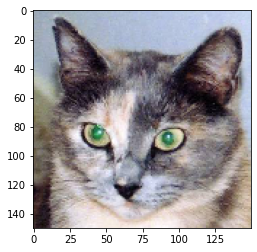

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/cats/cat.1700.jpg'

# 이미지를 4D 텐서로 변경
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

# 이미지 텐서의 크기
print(img_tensor.shape)

plt.imshow(img_tensor[0])
plt.show()

In [ ]:
# 상위 8개 층의 출력을 추출
layer_outputs = [layer.output for layer in model.layers[:8]]
# 입력에 대해 8개 층의 출력을 반환하는 모델
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
# 층의 활성화마다 하나씩 8개의 넘파이 배열로 이루어진 리스트를 반환
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


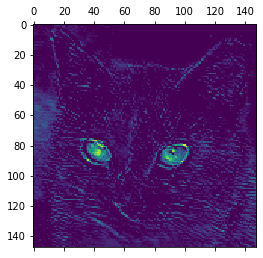

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.show()

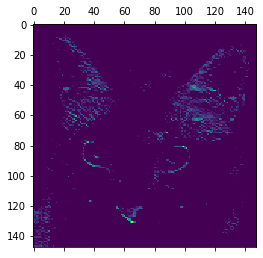

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 15], cmap='viridis')
plt.show()

## **1.2 모든 활성화 층의 맵 시각화 - cat**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


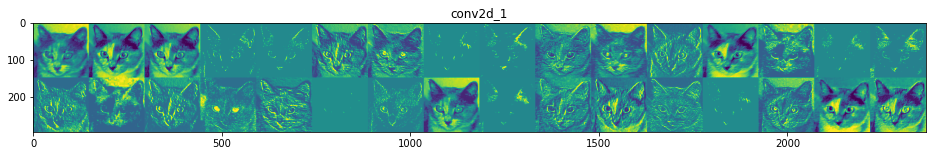

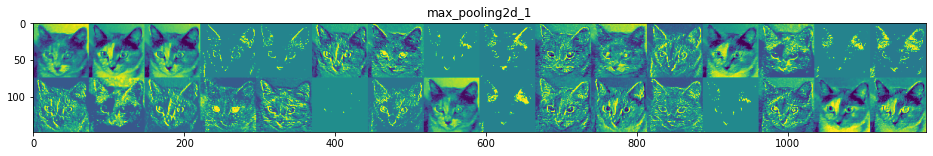

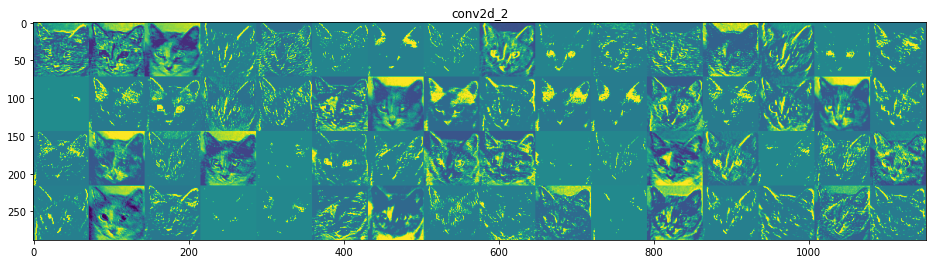

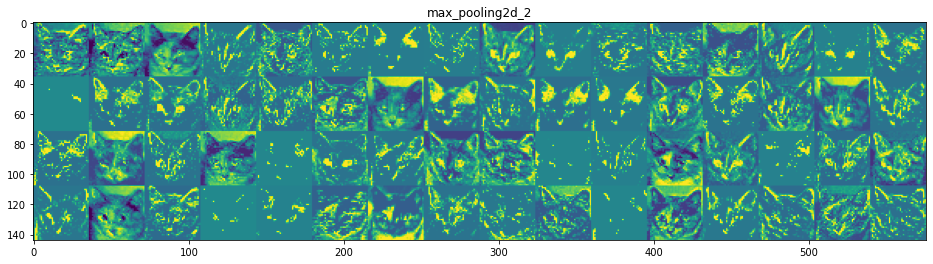

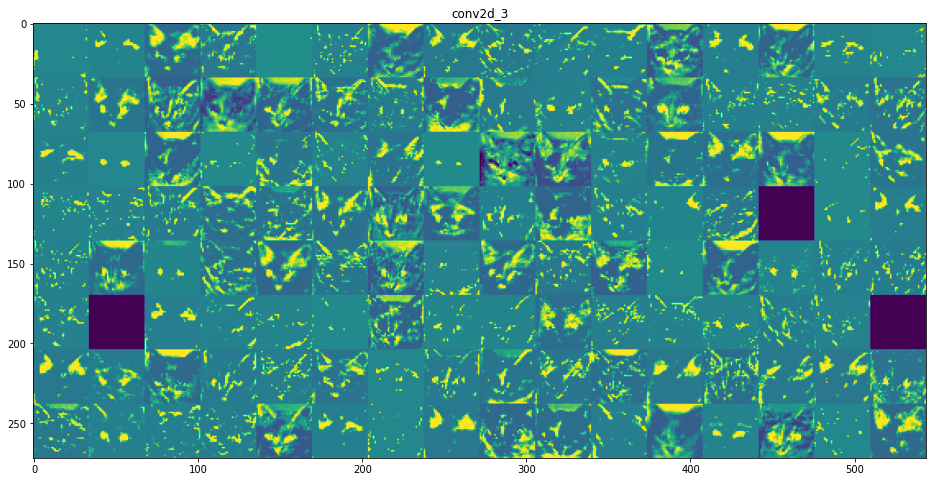

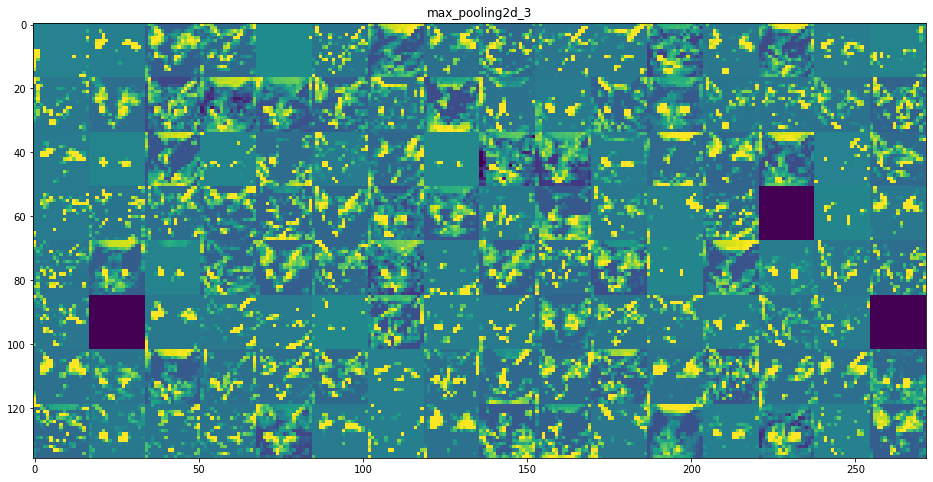

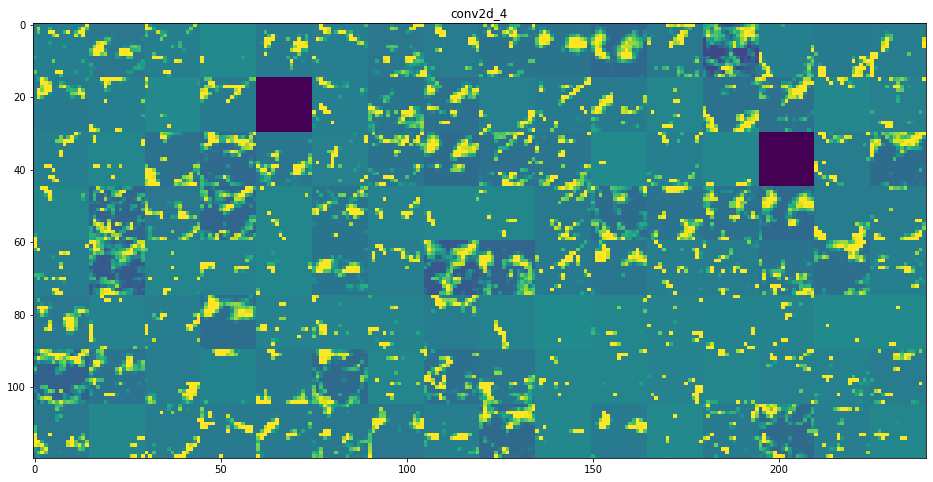

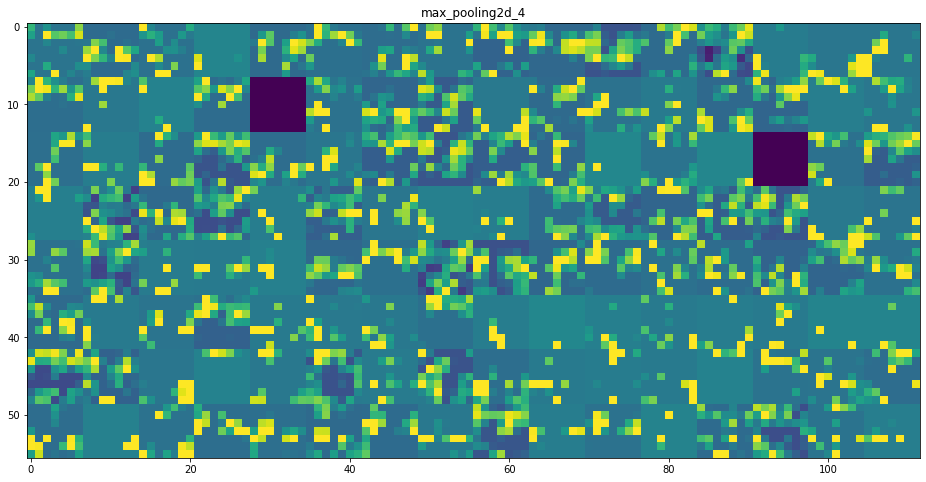

In [ ]:
# 층의 이름을 그래프 제목으로 사용
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵 그리기
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채우기
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

## **1.3 모든 활성화 층의 맵 시각화 - dog**

(1, 150, 150, 3)


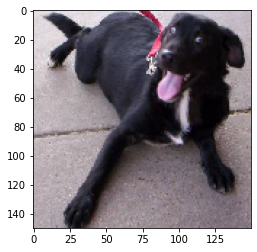

(1, 148, 148, 32)


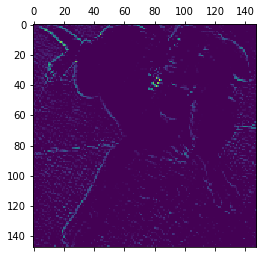

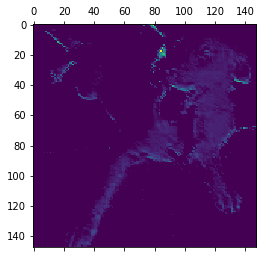

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in true_divide


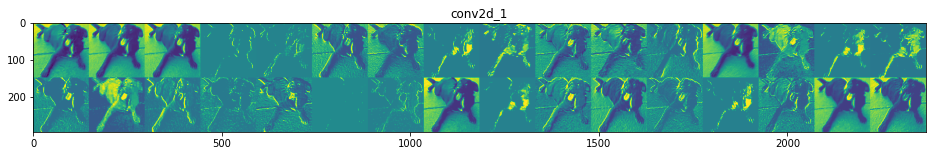

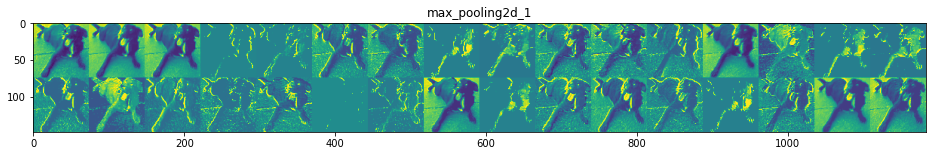

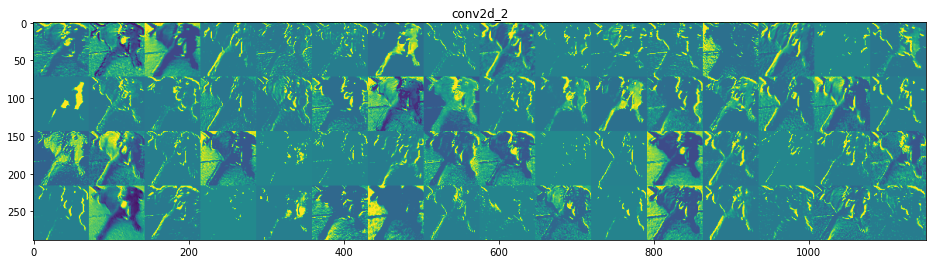

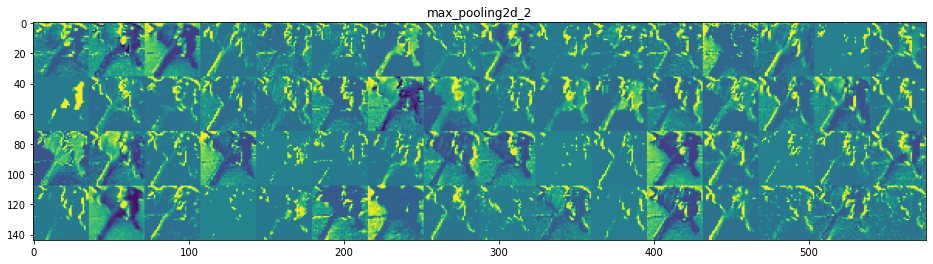

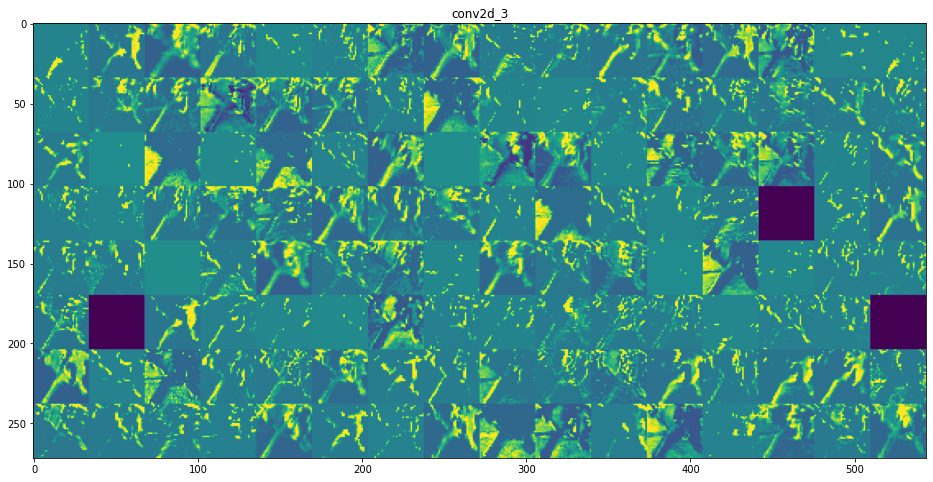

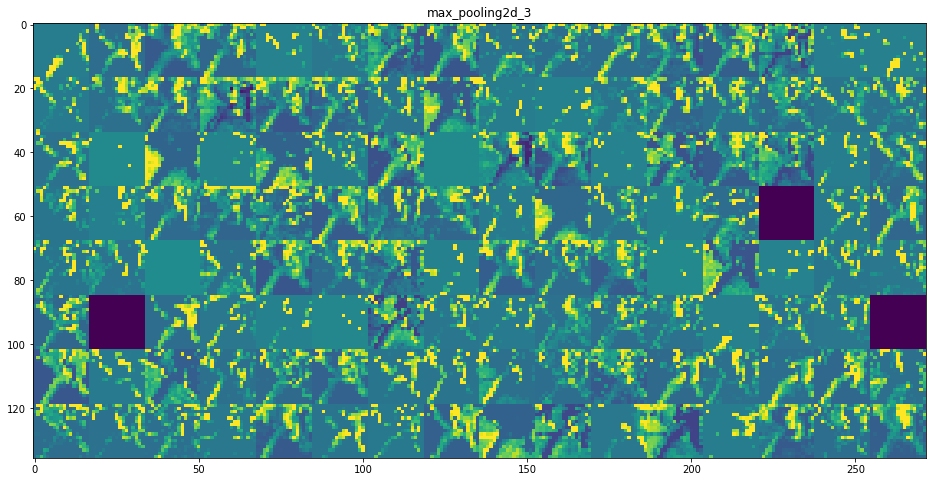

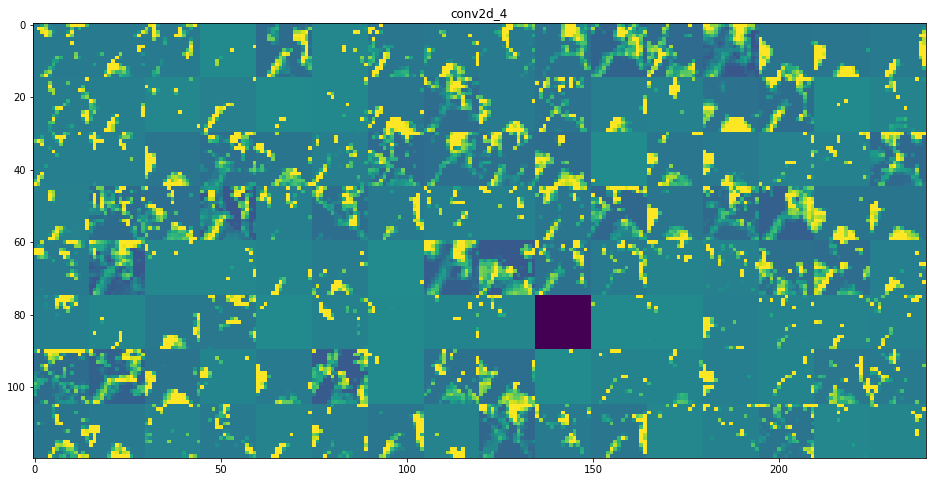

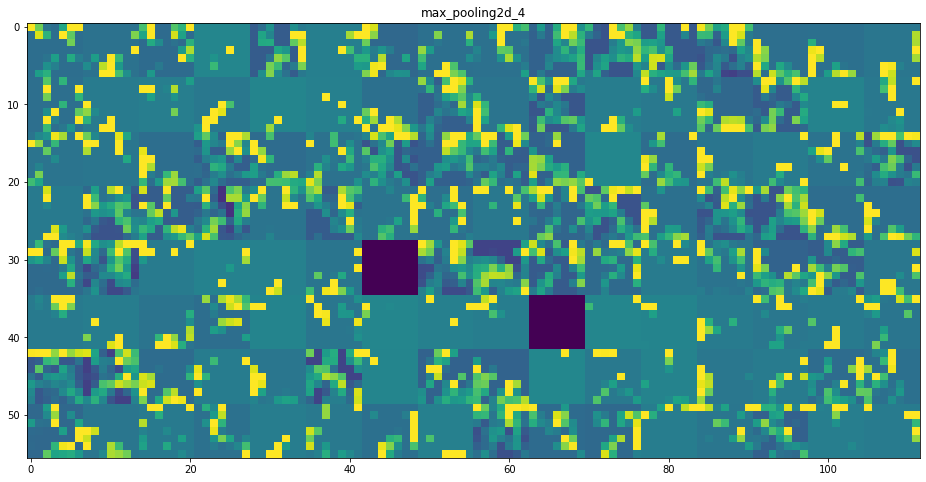

In [5]:
img_path = '/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/dogs/dog.1700.jpg'

# 이미지를 4D 텐서로 변경
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

# 이미지 텐서의 크기
print(img_tensor.shape)

plt.imshow(img_tensor[0])
plt.show()

# 상위 8개 층의 출력을 추출
layer_outputs = [layer.output for layer in model.layers[:8]]
# 입력에 대해 8개 층의 출력을 반환하는 모델
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
# 층의 활성화마다 하나씩 8개의 넘파이 배열로 이루어진 리스트를 반환
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 15], cmap='viridis')
plt.show()

# 층의 이름을 그래프 제목으로 사용
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵 그리기
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채우기
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

## **2. 컨브넷 필터 시각화**

In [6]:
! pip install keras.applications

     |████████████████████████████████| 50 kB 5.3 MB/s 


In [ ]:
# ImageNet에 사전 훈련된 VGG16 네트워크에서 block3_conv1 층의 필터 0번의 활성화를 손실로 정의
model = VGG16(weights='imagenet', include_top=False)
layer_name = 'block3_conv1'
filter_index = 0
layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

# gradients 함수가 반환하는 텐서 리스트(여기에서는 크기가 1인 리스트)에서 첫 번째 텐서를 추출
grads = K.gradients(loss, model.input)[0]
# 0 나눗셈을 방지하기 위해 1e–5을 더하기
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
# 넘파이 텐서(크기가 1인 텐서의 리스트)를 입력으로 받아 손실과 그래디언트 두 개의 넘파이 텐서를 반환
iterate = K.function([model.input], [loss, grads])

# 테스트:
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

반복문으로 확률적 경사 상승법 구성하기

In [ ]:
# 잡음이 섞인 회색 이미지로 시작
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# 업데이트할 그래디언트의 크기
step = 1.
for i in range(40):   # 경사 상승법 40회
    # 손실과 그래디언트를 계산
    loss_value, grads_value = iterate([input_img_data])
    # 손실을 최대화하는 방향으로 입력 이미지를 수정
    input_img_data += grads_value * step

- 결과 이미지 텐서는 (1, 150, 150, 3) 크기의 부동 소수 텐서
- 이 텐서의 값은 [0, 255] 사이의 정수가 아님
- 따라서 출력 가능한 이미지로 변경하기 위해 후처리할 필요가 있음

In [ ]:
def deprocess_image(x):
    # 텐서의 평균이 0, 표준 편차가 0.1이 되도록 정규화
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # [0, 1]로 클리핑
    x += 0.5
    x = np.clip(x, 0, 1)

    # RGB 배열로 변환
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

- 층의 이름과 필터 번호를 입력으로 받는 함수
- 필터 활성화를 최대화하는 패턴을 이미지 텐서로 출력


In [ ]:
def generate_pattern(layer_name, filter_index, size=150):
    # 주어진 층과 필터의 활성화를 최대화하기 위한 손실 함수를 정의
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # 손실에 대한 입력 이미지의 그래디언트를 계산
    grads = K.gradients(loss, model.input)[0]

    # 그래디언트 정규화
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # 입력 이미지에 대한 손실과 그래디언트를 반환
    iterate = K.function([model.input], [loss, grads])
    
    # 잡음이 섞인 회색 이미지로 시작
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # 경사 상승법을 40 단계 실행
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

- 아래 예시를 통해 block3_conv1 층의 필터 0은 물방울 패턴에 반응하는 것을 확인 가능

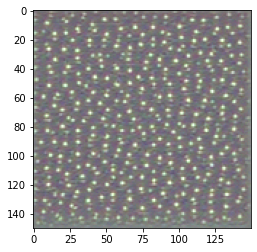

In [ ]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

- 이제 모든 층의 필터 시각화
- 간단히 각 층에서 처음 64개의 필터만 시각화, 각 합성곱 블럭의 첫 번째 층만 시각화(block1_conv1,block2_conv1,block3_conv1,block4_conv1)
- 출력을 64 × 64 필터 패턴의 8 × 8 그리드로 정렬
- 각 필터 패턴 사이에 검은 색 마진을 두어 구분

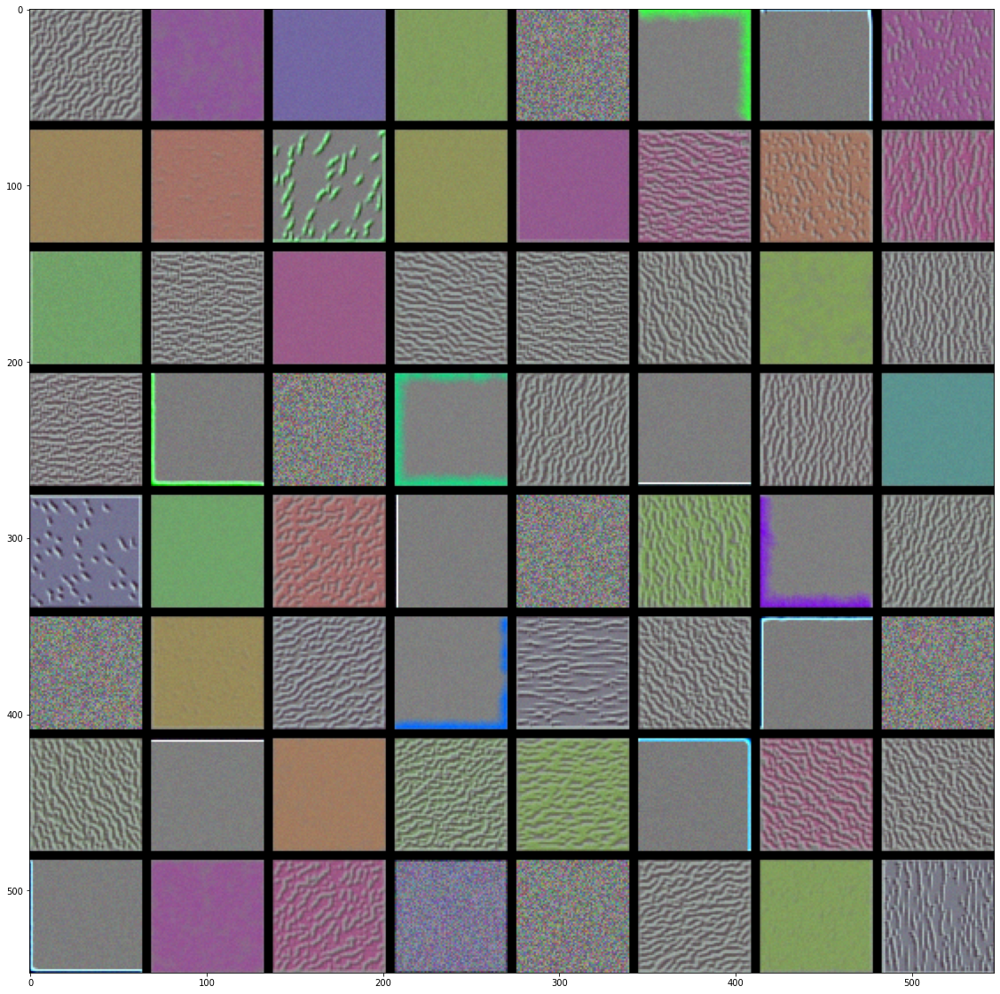

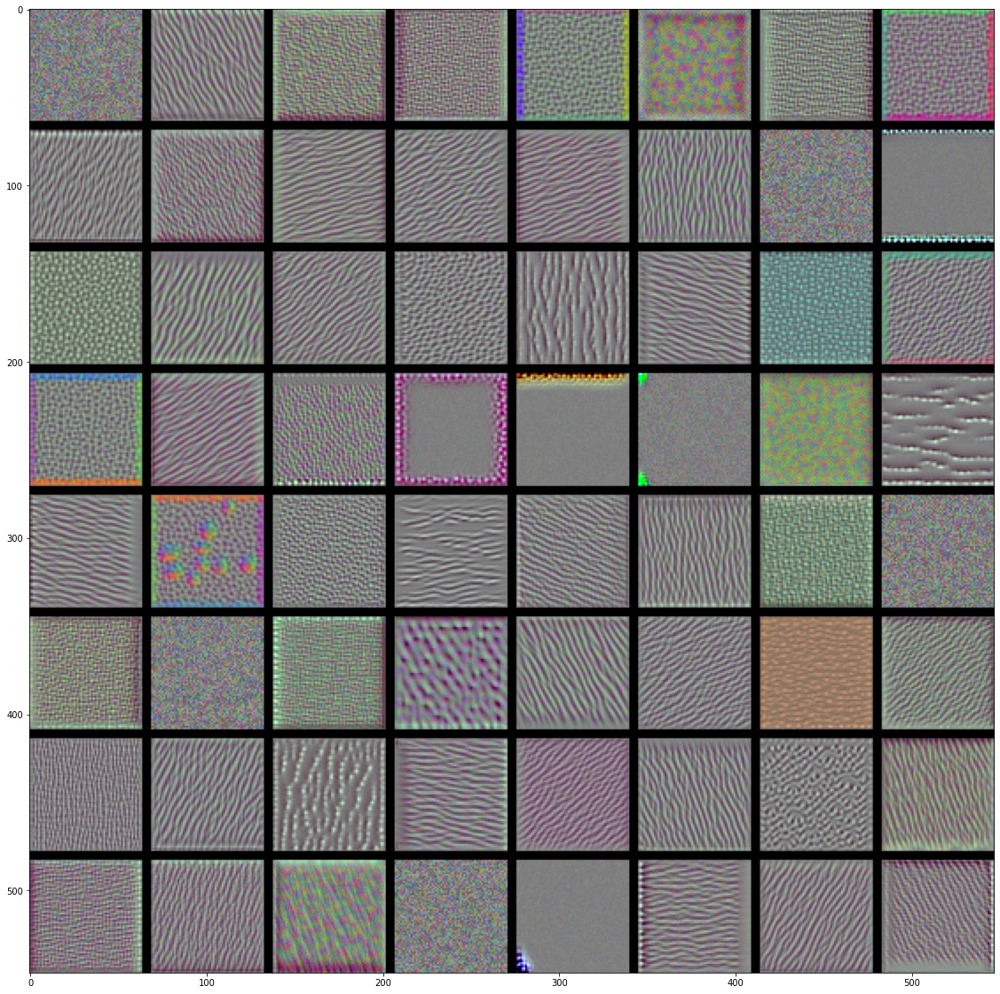

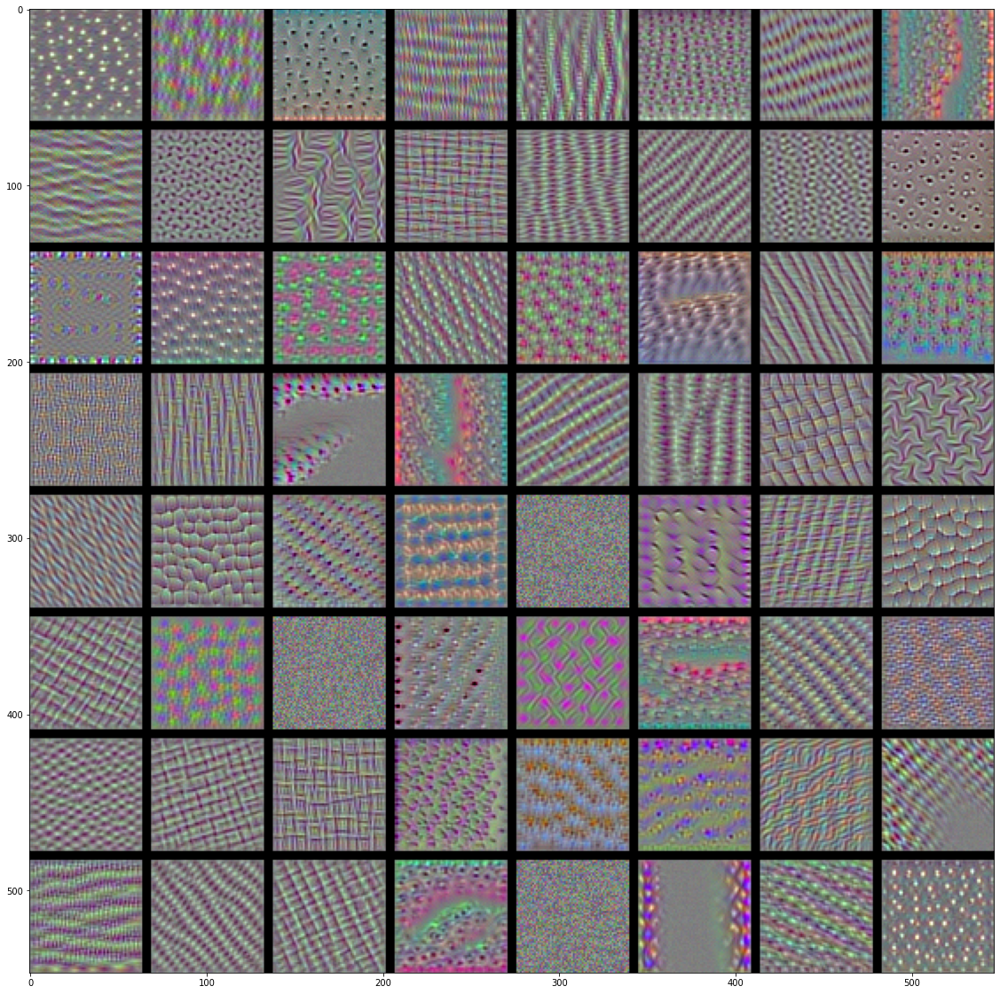

KeyboardInterrupt: ignored

In [ ]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # 결과를 담을 빈 (검은) 이미지
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

    for i in range(8):  # results 그리드의 행을 반복
        for j in range(8):  # results 그리드의 열을 반복
            # layer_name에 있는 i + (j * 8)번째 필터에 대한 패턴 생성
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # results 그리드의 (i, j) 번째 위치에 저장
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # results 그리드
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

## **3. 클래스 활성화의 히트맵 시각화**

## **3.1 Elephant(textbook example)**

In [7]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# 이전 모든 예제에서는 최상단의 완전 연결 분류기를 제외했지만 여기서는 포함
model = VGG16(weights='imagenet')

553476096/553467096 [==============================] - 6s 0us/step


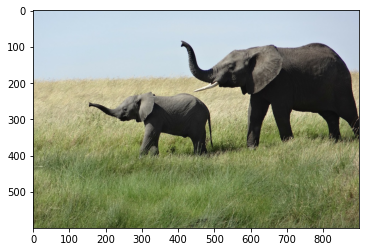

In [ ]:
import matplotlib.image as img

image = img.imread("/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/creative_commons_elephant.jpg")
plt.imshow(image)
plt.show()

In [ ]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# 이미지 경로
img_path = '/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/creative_commons_elephant.jpg'

# 224 × 224 크기의 파이썬 이미징 라이브러리(PIL) 객체로 반환
img = image.load_img(img_path, target_size=(224, 224))

# (224, 224, 3) 크기의 넘파이 float32 배열
x = image.img_to_array(img)

# 차원을 추가하여 (1, 224, 224, 3) 크기의 배치로 배열을 변환
x = np.expand_dims(x, axis=0)

# 데이터를 전처리(채널별 컬러 정규화를 수행)
x = preprocess_input(x)

In [ ]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


49152/35363 [=========================================] - 0s 0us/step
Predicted: [('n02504458', 'African_elephant', 0.90942115), ('n01871265', 'tusker', 0.08618273), ('n02504013', 'Indian_elephant', 0.0043545915)]


In [ ]:
np.argmax(preds[0])

386

In [ ]:
# 예측 벡터의 '아프리카 코끼리' 항목
african_elephant_output = model.output[:, 386]

# VGG16의 마지막 합성곱 층인 block5_conv3 층의 특성 맵
last_conv_layer = model.get_layer('block5_conv3')

# block5_conv3의 특성 맵 출력에 대한 '아프리카 코끼리' 클래스의 그래디언트
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# 특성 맵 채널별 그래디언트 평균 값이 담긴 (512,) 크기의 벡터
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# 샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# 두 마리 코끼리가 있는 샘플 이미지를 주입하고 두 개의 넘파이 배열
pooled_grads_value, conv_layer_output_value = iterate([x])

# "아프리카 코끼리" 클래스에 대한 "채널의 중요도"를 특성 맵 배열의 채널에 곱하기
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵
heatmap = np.mean(conv_layer_output_value, axis=-1)

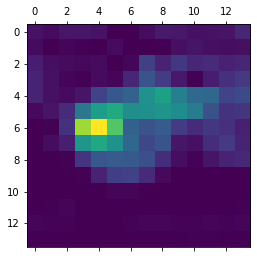

In [ ]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
import cv2

# cv2 모듈을 사용해 원본 이미지를 로드
img = cv2.imread(img_path)

# heatmap을 원본 이미지 크기에 맞게 변경
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# heatmap을 RGB 포맷으로 변환
heatmap = np.uint8(255 * heatmap)

# 히트맵으로 변환
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4는 히트맵의 강도
superimposed_img = heatmap * 0.4 + img

# 디스크에 이미지를 저장
cv2.imwrite('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/elephant_cam.jpg', superimposed_img)

True

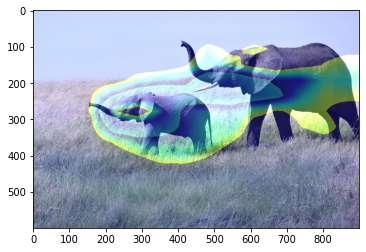

In [ ]:
import matplotlib.image as img

image = img.imread("/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/elephant_cam.jpg")
plt.imshow(image)
plt.show()

## **3.2 Cat(Customized example)**

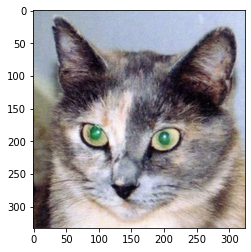

In [13]:
import matplotlib.image as img

image_example = img.imread('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/cats/cat.1700.jpg')
plt.imshow(image_example)
plt.show()

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Predicted: [('n02124075', 'Egyptian_cat', 0.52406096), ('n02119789', 'kit_fox', 0.17562264), ('n02120505', 'grey_fox', 0.0622718)]


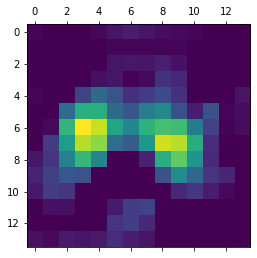

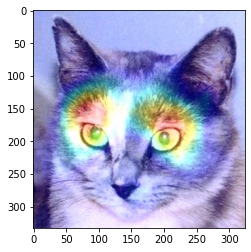

In [18]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

from keras.applications.vgg16 import VGG16

K.clear_session()

# 이전 모든 예제에서는 최상단의 완전 연결 분류기를 제외했지만 여기서는 포함
model = VGG16(weights='imagenet')

# 이미지 경로
img_path = '/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/cats/cat.1700.jpg'

# 224 × 224 크기의 파이썬 이미징 라이브러리(PIL) 객체로 반환
img = image.load_img(img_path, target_size=(224, 224))

# (224, 224, 3) 크기의 넘파이 float32 배열
x = image.img_to_array(img)

# 차원을 추가하여 (1, 224, 224, 3) 크기의 배치로 배열을 변환
x = np.expand_dims(x, axis=0)

# 데이터를 전처리(채널별 컬러 정규화를 수행)
x = preprocess_input(x)

preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

# 예측 벡터의 항목
cat_output = model.output[:, np.argmax(preds[0])]

# VGG16의 마지막 합성곱 층인 block5_conv3 층의 특성 맵
last_conv_layer = model.get_layer('block5_conv3')

# block5_conv3의 특성 맵 출력에 대한 클래스의 그래디언트
grads = K.gradients(cat_output, last_conv_layer.output)[0]

# 특성 맵 채널별 그래디언트 평균 값이 담긴 (512,) 크기의 벡터
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# 샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# 샘플 이미지를 주입하고 두 개의 넘파이 배열을 얻기
pooled_grads_value, conv_layer_output_value = iterate([x])

# 해당 클래스에 대한 "채널의 중요도"를 특성 맵 배열의 채널에 곱하기
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵
heatmap = np.mean(conv_layer_output_value, axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

import cv2

# cv2 모듈을 사용해 원본 이미지를 로드
img = cv2.imread(img_path)

# heatmap을 원본 이미지 크기에 맞게 변경
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# heatmap을 RGB 포맷으로 변환
heatmap = np.uint8(255 * heatmap)

# 히트맵으로 변환
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4는 히트맵의 강도
superimposed_img = heatmap * 0.4 + img

# 디스크에 이미지를 저장
cv2.imwrite('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cat_cam.jpg', superimposed_img)

import matplotlib.image as img

image = img.imread("/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cat_cam.jpg")
plt.imshow(image)
plt.show()

- test data set에 포함되어 있는 cat1700에 대해서 모델은 이집트 고양이로 가장 큰 확률로 분류한다.
- 이집트 고양이 : 키트여우 : 회색여우 = 52% : 18% : 6%
- 사진에서 활성화 된 부위를 눈 주변이다.
- 이를 통해 해당 모델이 위 사진에 대해 이집트 고양이라고 판별하는 특징은 눈과 그 주변 부위의 형태적 특성인 것으로 보인다.

## **3.3 Dog(Customized example)**

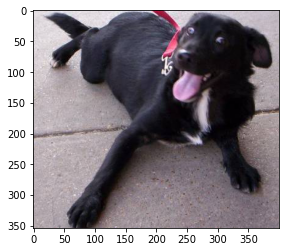

In [20]:
import matplotlib.image as img

image_example = img.imread('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/dogs/dog.1700.jpg')
plt.imshow(image_example)
plt.show()

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Predicted: [('n02099267', 'flat-coated_retriever', 0.7470357), ('n02099712', 'Labrador_retriever', 0.07271134), ('n02099429', 'curly-coated_retriever', 0.056394074)]


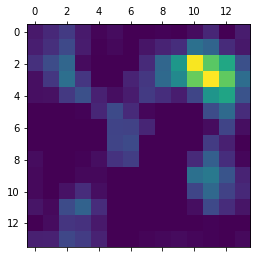

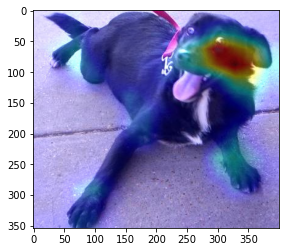

In [21]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

from keras.applications.vgg16 import VGG16

K.clear_session()

# 이전 모든 예제에서는 최상단의 완전 연결 분류기를 제외했지만 여기서는 포함
model = VGG16(weights='imagenet')

# 이미지 경로
img_path = '/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/cats_and_dogs_small/test/dogs/dog.1700.jpg'

# 224 × 224 크기의 파이썬 이미징 라이브러리(PIL) 객체로 반환
img = image.load_img(img_path, target_size=(224, 224))

# (224, 224, 3) 크기의 넘파이 float32 배열
x = image.img_to_array(img)

# 차원을 추가하여 (1, 224, 224, 3) 크기의 배치로 배열을 변환
x = np.expand_dims(x, axis=0)

# 데이터를 전처리(채널별 컬러 정규화를 수행)
x = preprocess_input(x)

preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

# 예측 벡터의 항목
cat_output = model.output[:, np.argmax(preds[0])]

# VGG16의 마지막 합성곱 층인 block5_conv3 층의 특성 맵
last_conv_layer = model.get_layer('block5_conv3')

# block5_conv3의 특성 맵 출력에 대한 클래스의 그래디언트
grads = K.gradients(cat_output, last_conv_layer.output)[0]

# 특성 맵 채널별 그래디언트 평균 값이 담긴 (512,) 크기의 벡터
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# 샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# 샘플 이미지를 주입하고 두 개의 넘파이 배열을 얻기
pooled_grads_value, conv_layer_output_value = iterate([x])

# 해당 클래스에 대한 "채널의 중요도"를 특성 맵 배열의 채널에 곱하기
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵
heatmap = np.mean(conv_layer_output_value, axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

import cv2

# cv2 모듈을 사용해 원본 이미지를 로드
img = cv2.imread(img_path)

# heatmap을 원본 이미지 크기에 맞게 변경
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# heatmap을 RGB 포맷으로 변환
heatmap = np.uint8(255 * heatmap)

# 히트맵으로 변환
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4는 히트맵의 강도
superimposed_img = heatmap * 0.4 + img

# 디스크에 이미지를 저장
cv2.imwrite('/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/dog_cam.jpg', superimposed_img)

import matplotlib.image as img

image = img.imread("/content/drive/MyDrive/Colab Notebooks/고급딥러닝HW/datasets/dog_cam.jpg")
plt.imshow(image)
plt.show()

- test data set에 포함되어 있는 dog1700에 대해서 모델은 플랫 코티드 리트리버로 가장 큰 확률로 분류한다.
- 플랫 코티드 리트리버 : 래브라도 리트리버 : 컬리 코티드 리트리버 = 75% : 7% : 6%
- 사진에서 활성화 된 부위는 얼굴에선 미즐과 귀 부분, 그리고 몸에선 발 부분이다.
- 이를 통해 해당 모델이 위 사진에 대해 플랫 코티드 리트리버라고 판별하는 특징은 미즐과 귀 부분 그리고 발 부위의 형태적 특성인 것으로 보인다.